Generating background...


100%|█████████████████████████████████████████████████████████████████████████████| 100/100 [00:27<00:00,  3.60it/s]


Generated Background


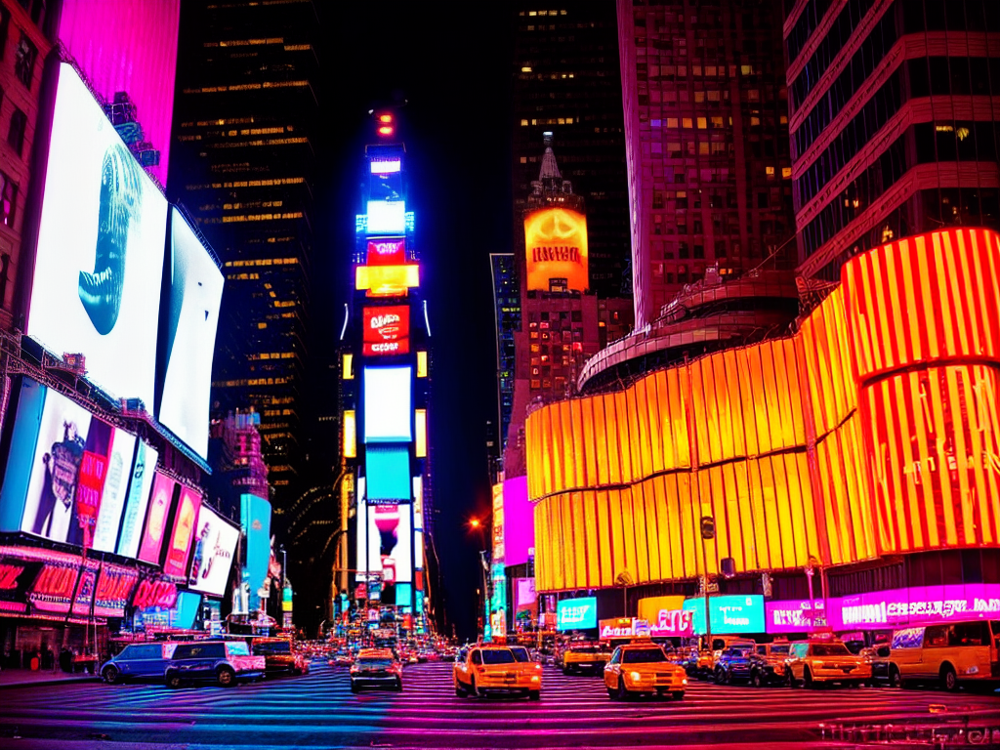

Processing character...


100%|███████████████████████████████████████████████████████████████████████████████| 50/50 [00:42<00:00,  1.19it/s]


Processed Character


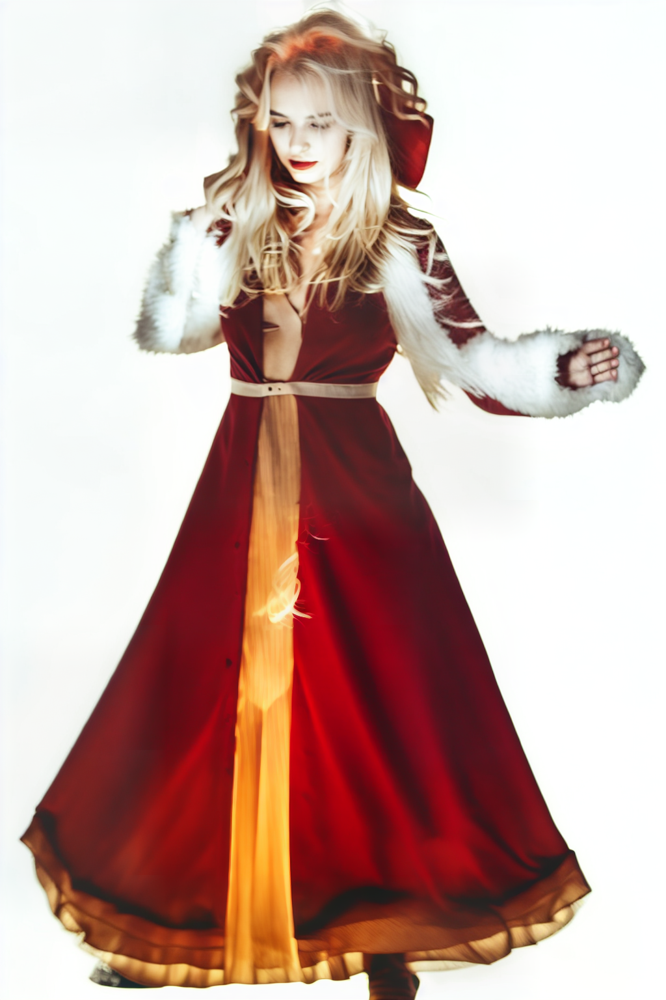

Character without Background


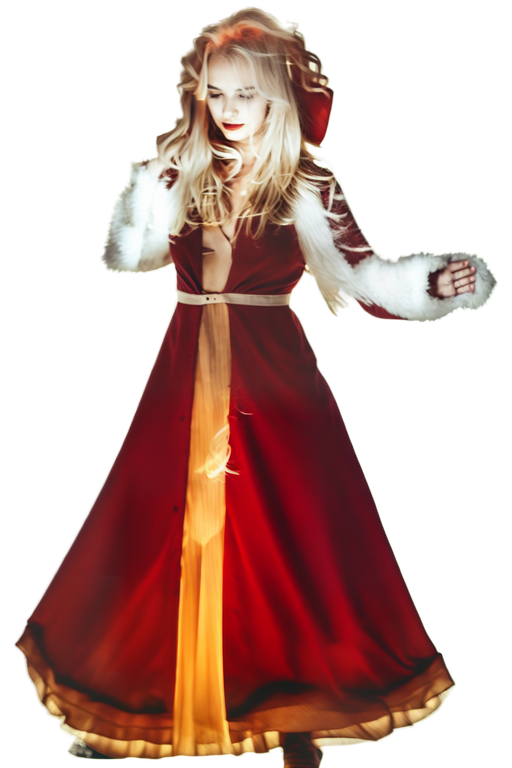

Creating final composition...
Final Composition


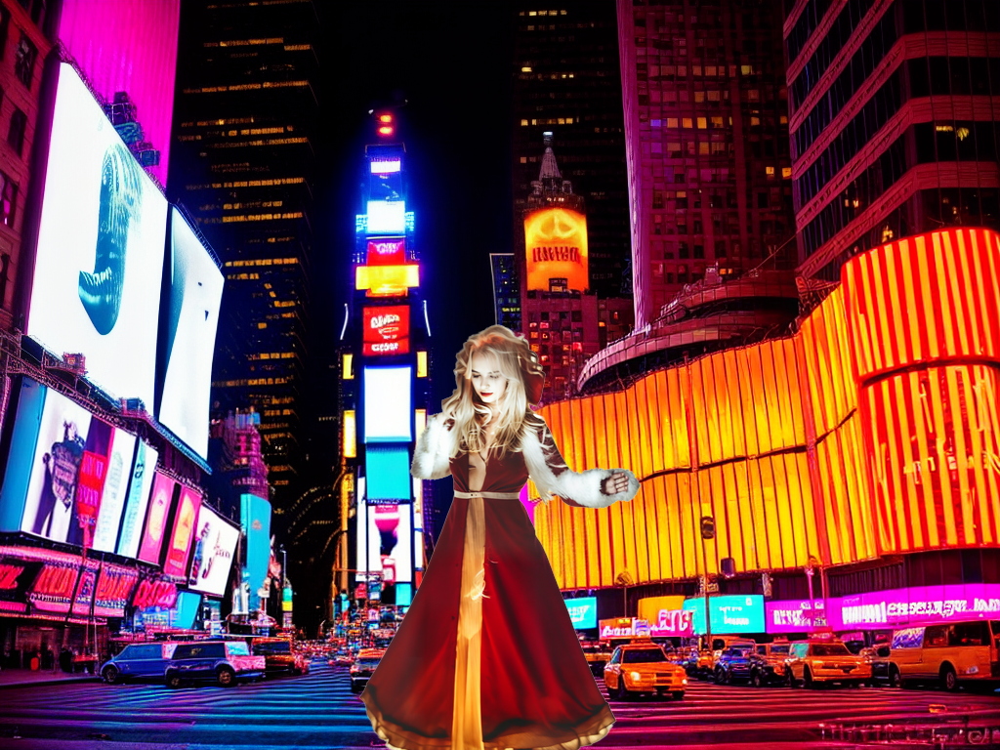

In [21]:
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
import torch
from PIL import Image
from rembg import remove
import os
gc
from IPython.display import display

def show_image(image, title=None):
    if title:
        print(title)
    display(image)

def clean_memory():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

def generate_times_square_background(pipeline, output_dir):
    background_prompt = "Times Square at night, neon signs, LED lights, vibrant colors, high contrast"
    negative_prompt = "cartoon, drawing, painting, anime, 3d render, blurry, people, crowds"
    
    background = pipeline(
        prompt=background_prompt,
        negative_prompt=negative_prompt,
        height=768,
        width=1024,
        num_inference_steps=100,
        guidance_scale=9.0,
    ).images[0]
    
    background.save(os.path.join(output_dir, "background.png"), quality=100)
    show_image(background, "Generated Background")
    return background

def process_character_image(img2img_pipeline, input_image_path, output_dir):
    init_image = Image.open(input_image_path).convert('RGB').resize((1024, 1536), Image.Resampling.LANCZOS)
    
    character_prompt = "young and sexy woman in red dress, blonde hair, confident pose, high contrast, photorealistic, glowing lighting"
    negative_prompt = "cartoon, older, middle aged, 3d render, drawing, unrealistic"
    
    processed_image = img2img_pipeline(
        prompt=character_prompt,
        negative_prompt=negative_prompt,
        image=init_image,
        strength=0.5,
        num_inference_steps=100,
        guidance_scale=8.5
    ).images[0]
    
    show_image(processed_image, "Processed Character")
    
    character_no_bg = remove(
        processed_image,
        alpha_matting=True,
        alpha_matting_foreground_threshold=240,
        alpha_matting_background_threshold=10,
        alpha_matting_erode_size=10,
        post_process_mask=True
    )
    
    character_no_bg = character_no_bg.resize((512, 768), Image.Resampling.LANCZOS)
    character_no_bg.save(os.path.join(output_dir, "character.png"), quality=100)
    show_image(character_no_bg, "Character without Background")
    return character_no_bg

def create_composite(character, background, output_dir):
    background = background.convert('RGBA')
    character = character.convert('RGBA')
    
    bg_width, bg_height = background.size
    
    char_height = int(bg_height * 0.6)
    char_width = int(char_height * character.size[0] / character.size[1])
    character = character.resize((char_width, char_height), Image.Resampling.LANCZOS)
    
    x_pos = (bg_width - char_width) // 2
    y_pos = bg_height - char_height + 20
    
    composite = background.copy()
    composite.paste(character, (x_pos, y_pos), character)
    composite.save(os.path.join(output_dir, "final.png"), quality=100)
    show_image(composite, "Final Composition")
    return composite

def generate_complete_scene(input_image_path="./llava/img/1.jpg", output_dir="output"):
    os.makedirs(output_dir, exist_ok=True)
    
    print("Generating background...")
    txt2img_pipeline = StableDiffusionPipeline.from_pretrained(
        "./dreamlike-photoreal-2.0",
        torch_dtype=torch.float16,
        safety_checker=None,
        requires_safety_checker=False
    ).to("cuda")
    txt2img_pipeline.enable_vae_tiling()
    txt2img_pipeline.enable_attention_slicing()
    
    background = generate_times_square_background(txt2img_pipeline, output_dir)
    del txt2img_pipeline
    clean_memory()
    
    print("Processing character...")
    img2img_pipeline = StableDiffusionImg2ImgPipeline.from_pretrained(
        "./dreamlike-photoreal-2.0",
        torch_dtype=torch.float16,
        safety_checker=None,
        requires_safety_checker=False
    ).to("cuda")
    img2img_pipeline.enable_vae_tiling()
    img2img_pipeline.enable_attention_slicing()
    
    character = process_character_image(img2img_pipeline, input_image_path, output_dir)
    del img2img_pipeline
    clean_memory()
    
    print("Creating final composition...")
    return create_composite(character, background, output_dir)

os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"

# Run the pipeline
final_image = generate_complete_scene()


Generating background...


100%|█████████████████████████████████████████████████████████████████████████████| 100/100 [00:27<00:00,  3.58it/s]


Generated Background


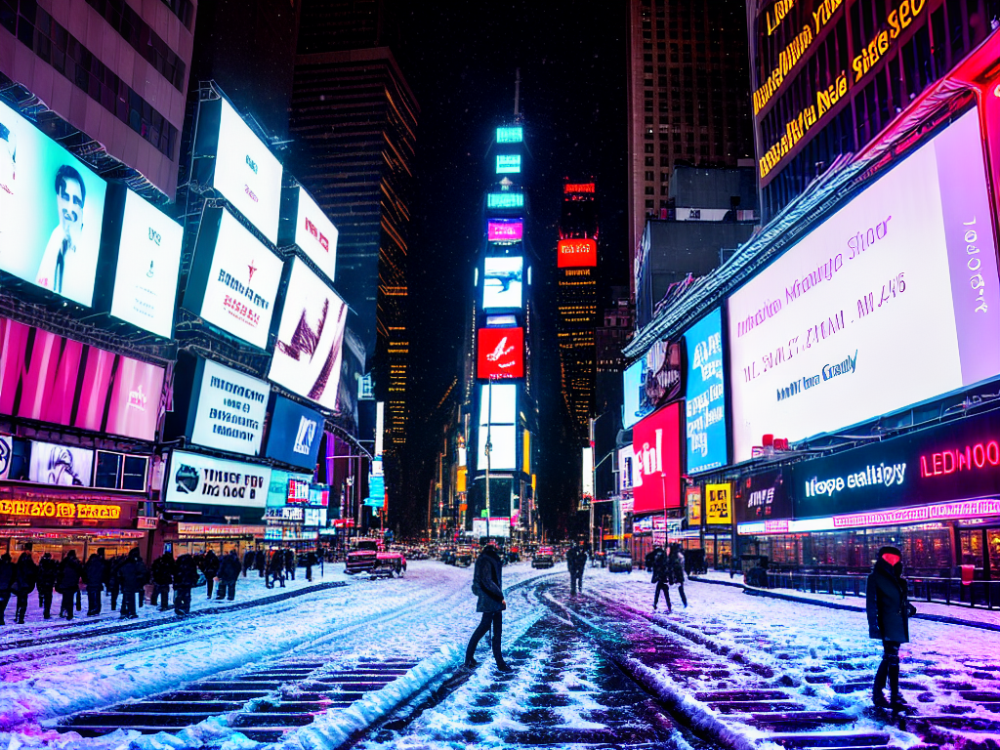

Processing character...


100%|███████████████████████████████████████████████████████████████████████████████| 65/65 [00:54<00:00,  1.18it/s]


Processed Character


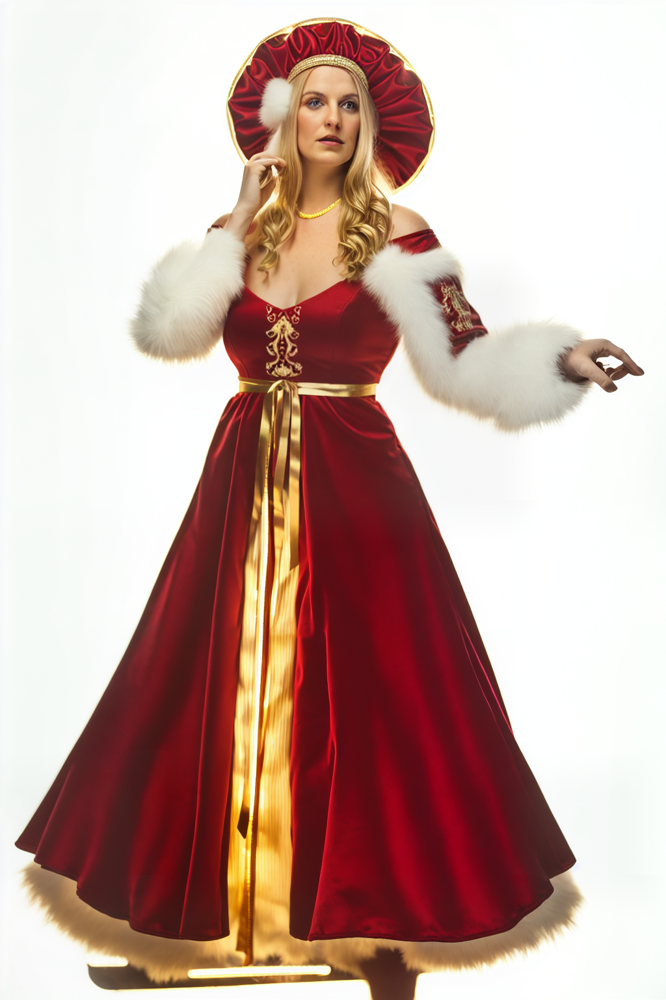

Character without Background


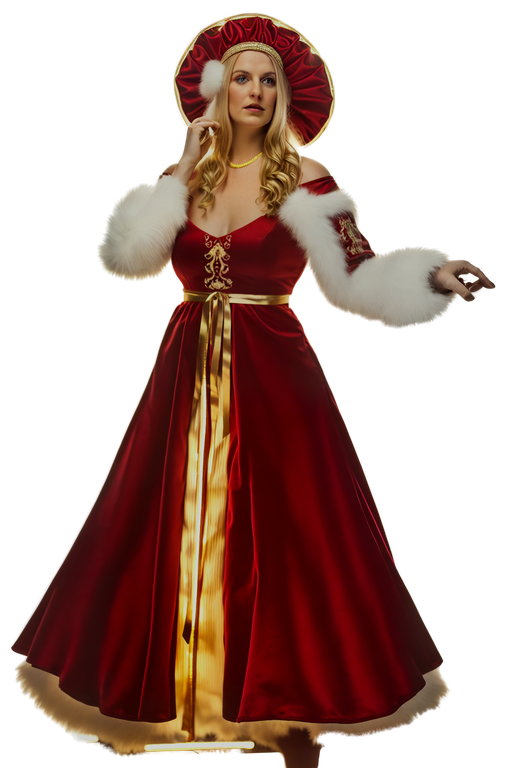

Creating final composition...
Final Composition


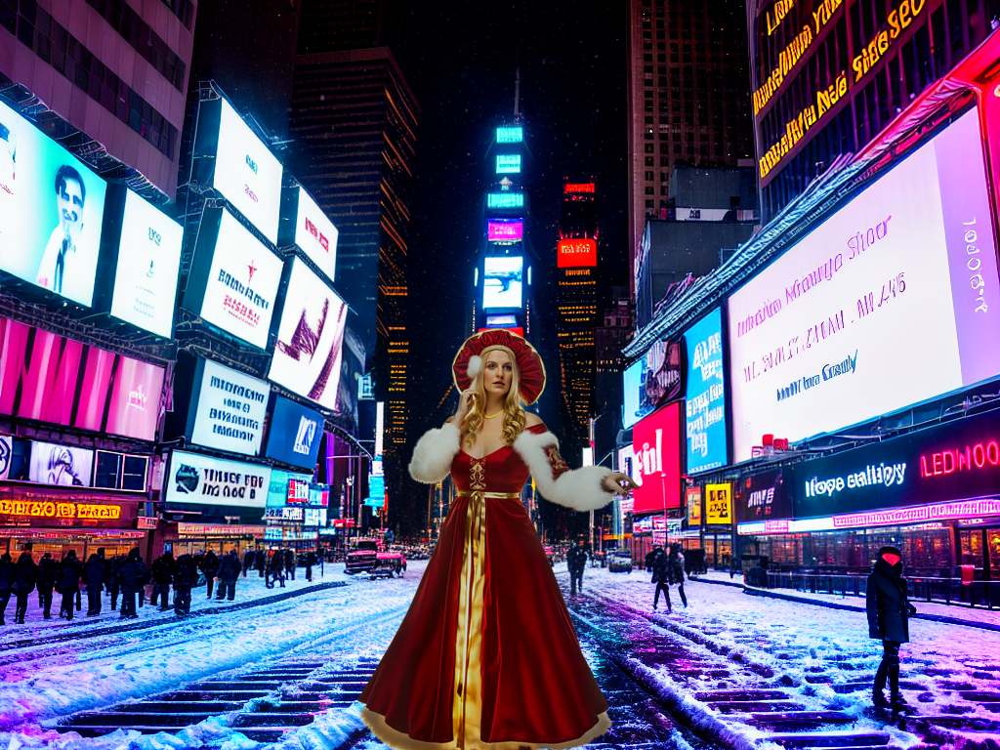

In [14]:
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
import torch
from PIL import Image, ImageEnhance
from rembg import remove
import os
import gc
from IPython.display import display

def show_image(image, title=None):
    if title:
        print(title)
    display(image)

def clean_memory():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

def generate_times_square_background(pipeline, output_dir):
    background_prompt = """
    stunning snowing night photograph of Times Square New York City, street level view,
    giant LED billboards and neon signs, cinematic lighting, amazing atmosphere,
    high-end architectural photography, photorealistic, 
    premium quality cityscape, 8k resolution, ultra detailed urban environment,
    Sony A7R IV, 24mm f/1.4 lens, dark winter evening
    """.strip()
    
    negative_prompt = """
    cartoon, drawing, painting, artwork, low quality, blurry, grainy,
    oversaturated, unrealistic, distorted perspective, bad architecture,
    people, humans, crowds, daylight, sunny, bright day
    """.strip()       
    
    background = pipeline(
        prompt=background_prompt,
        negative_prompt=negative_prompt,
        height=768,
        width=1024,
        num_inference_steps=100,
        guidance_scale=9.0,
    ).images[0]
    
    background.save(os.path.join(output_dir, "background.png"), quality=100)
    show_image(background, "Generated Background")
    return background

def process_character_image(img2img_pipeline, input_image_path, output_dir):
    init_image = Image.open(input_image_path).convert('RGB').resize((1024, 1536), Image.Resampling.LANCZOS)
    
    character_prompt = """
    A 20 years old white and sexy American woman in traditional Russian red sarafan dress with gold embroidery 
    and kokoshnik headdress, photographed at night under city lights and neon signs, 
    dramatic evening lighting, soft shadows, ambient light from surrounding buildings,
    photorealistic night portrait, moody atmosphere
    """.strip()
    
    negative_prompt = """
    face coverage, mouth coverage, mask, veil, obscured face, hidden face,
    blur, noise, deformed face, distorted features, bad face, weird face,
    anime, cartoon, illustration, painting, artificial, harsh shadows,
    unclear features, overexposed, daylight, bright sunlight, grainy, low quality
    """.strip()
    
    processed_image = img2img_pipeline(
        prompt=character_prompt,
        negative_prompt=negative_prompt,
        image=init_image,
        strength=0.65,  # Increased strength for more dramatic lighting
        num_inference_steps=100,
        guidance_scale=8.5
    ).images[0]
    
    show_image(processed_image, "Processed Character")
    
    character_no_bg = remove(
        processed_image,
        alpha_matting=True,
        alpha_matting_foreground_threshold=240,
        alpha_matting_background_threshold=10,
        alpha_matting_erode_size=10,
        post_process_mask=True
    )
    
    # Apply evening lighting adjustments
    character_no_bg = character_no_bg.convert('RGBA')
    
    # Create separate brightness and contrast adjustments
    brightness = ImageEnhance.Brightness(character_no_bg)
    character_no_bg = brightness.enhance(0.75)  # Reduce brightness
    
    contrast = ImageEnhance.Contrast(character_no_bg)
    character_no_bg = contrast.enhance(1.2)  # Increase contrast slightly
    
    character_no_bg = character_no_bg.resize((512, 768), Image.Resampling.LANCZOS)
    character_no_bg.save(os.path.join(output_dir, "character.png"), quality=100)
    show_image(character_no_bg, "Character without Background")
    return character_no_bg

def create_composite(character, background, output_dir):
    background = background.convert('RGBA')
    character = character.convert('RGBA')
    
    bg_width, bg_height = background.size
    
    char_height = int(bg_height * 0.6)
    char_width = int(char_height * character.size[0] / character.size[1])
    character = character.resize((char_width, char_height), Image.Resampling.LANCZOS)
    
    # Apply a subtle blue tint to match the evening atmosphere
    r, g, b, a = character.split()
    r = r.point(lambda x: x * 0.95)  # Reduce red slightly
    b = b.point(lambda x: x * 1.05)  # Increase blue slightly
    character = Image.merge('RGBA', (r, g, b, a))
    
    x_pos = (bg_width - char_width) // 2
    y_pos = bg_height - char_height + 20
    
    composite = background.copy()
    composite.paste(character, (x_pos, y_pos), character)
    
    # Final adjustments to the whole image
    composite = composite.convert('RGB')
    enhancer = ImageEnhance.Color(composite)
    composite = enhancer.enhance(1.1)  # Slightly enhance colors to make neon pop
    
    composite.save(os.path.join(output_dir, "final.png"), quality=100)
    show_image(composite, "Final Composition")
    return composite

def generate_complete_scene(input_image_path="./llava/img/1.jpg", output_dir="output"):
    os.makedirs(output_dir, exist_ok=True)
    
    print("Generating background...")
    txt2img_pipeline = StableDiffusionPipeline.from_pretrained(
        "./dreamlike-photoreal-2.0",
        torch_dtype=torch.float16,
        safety_checker=None,
        requires_safety_checker=False
    ).to("cuda")
    txt2img_pipeline.enable_vae_tiling()
    txt2img_pipeline.enable_attention_slicing()
    
    background = generate_times_square_background(txt2img_pipeline, output_dir)
    del txt2img_pipeline
    clean_memory()
    
    print("Processing character...")
    img2img_pipeline = StableDiffusionImg2ImgPipeline.from_pretrained(
        "./dreamlike-photoreal-2.0",
        torch_dtype=torch.float16,
        safety_checker=None,
        requires_safety_checker=False
    ).to("cuda")
    img2img_pipeline.enable_vae_tiling()
    img2img_pipeline.enable_attention_slicing()
    
    character = process_character_image(img2img_pipeline, input_image_path, output_dir)
    del img2img_pipeline
    clean_memory()
    
    print("Creating final composition...")
    return create_composite(character, background, output_dir)

os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
final_image = generate_complete_scene()
